## Abstract

This project explores the generation of symbolic music using a Long Short-Term Memory (LSTM) network. Leveraging the NES-VMDB dataset, we aimed to extract and process MIDI files to train a generative model capable of composing new music inspired by learned patterns. The project includes a comprehensive pipeline to prepare data, train the LSTM model, and generate music sequences.

Key data preparation steps involved extracting note sequences from MIDI files and transforming them into a normalized input format compatible with the LSTM architecture. To incorporate user-provided inputs, we designed a workflow for downloading audio excerpts from YouTube, extracting relevant musical features using Mel-frequency Cepstral Coefficients (MFCCs), and converting them into MIDI-like sequences. The trained model generates new music based on these inputs, blending learned styles with user-defined seeds.

Our primary goal was to create a system that combines symbolic music learning with generative capabilities while ensuring compatibility with various musical input formats. The project successfully achieves this by producing coherent and stylistically informed music compositions. Outputs are provided as MIDI files or rendered audio, allowing for further refinement and playback. This work demonstrates the potential of deep learning models for creative applications in music generation and symbolic processing.

Import libraries.

In [18]:
import os
import glob
import numpy as np
import pretty_midi
import torch
import torch.nn as nn
import torch.optim as optim
import librosa
from IPython.display import Audio
import subprocess
from tqdm import tqdm
import requests
import zipfile
import matplotlib.pyplot as plt
import pickle
import json
import random

## Data

In [5]:
def download_and_extract_zip(zip_url, extract_path="nesmdb_data"):
    """
    Downloads and extracts a ZIP file from the given URL.
    """
    # Download the ZIP file
    response = requests.get(zip_url)
    zip_path = "nesmdb_midi.zip"
    with open(zip_path, "wb") as f:
        f.write(response.content)
    print("ZIP file downloaded.")

    # Extract the ZIP file
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_path)
    print(f"ZIP file extracted to {extract_path}.")

    # Remove the ZIP file after extraction
    os.remove(zip_path)
    print("ZIP file removed.")
    return extract_path

# Example usage
zip_url = "https://github.com/bruno-alv/IL181/raw/refs/heads/Music-project/nesmdb_midi.zip"
data_path = download_and_extract_zip(zip_url)

ZIP file downloaded.
ZIP file extracted to nesmdb_data.
ZIP file removed.


Define the Function to Retrieve MIDI Files.

In [6]:
def get_midi_files(base_path):
    """
    Retrieves all MIDI files from train, test, and valid directories.
    """
    datasets = {}
    for split in ["train", "test", "valid"]:
        split_path = os.path.join(base_path, "nesmdb_midi", split)
        midi_files = glob.glob(os.path.join(split_path, "*.mid"))
        datasets[split] = midi_files
        print(f"{split.capitalize()} Files: {len(midi_files)} found.")
    return datasets

# Get MIDI files
datasets = get_midi_files(data_path)

Train Files: 4502 found.
Test Files: 373 found.
Valid Files: 403 found.


Define a Function to Extract Note Sequences

In [7]:
def extract_note_sequences(midi_file):
    """
    Parses a MIDI file and extracts note sequences (pitches).
    """
    try:
        midi_data = pretty_midi.PrettyMIDI(midi_file)
        note_sequence = []
        for instrument in midi_data.instruments:
            if not instrument.is_drum:  # Skip drum tracks
                note_sequence.extend([note.pitch for note in instrument.notes])
        return note_sequence
    except Exception as e:
        print(f"Error processing {midi_file}: {e}")
        return None

Test our note extraction.

In [8]:
# Test with a single MIDI file
sample_midi_file = datasets["train"][0]
note_sequence = extract_note_sequences(sample_midi_file)

print(f"Sample MIDI File: {sample_midi_file}")
print(f"Extracted Note Sequence: {note_sequence[:10]}")  # Display first 10 notes

Sample MIDI File: nesmdb_data/nesmdb_midi/train/020_Athena_06_07WorldofSkyStage4.mid
Extracted Note Sequence: [72, 76, 71, 75, 72, 76, 79, 81, 79, 77]


Batch Process All MIDI Files.

In [9]:
def process_midi_files(midi_files):
    """
    Processes a list of MIDI files and extracts all note sequences.
    """
    all_sequences = []
    for midi_file in midi_files:
        sequence = extract_note_sequences(midi_file)
        if sequence:
            all_sequences.extend(sequence)
    return all_sequences

In [10]:
train_sequences = process_midi_files(datasets["train"])
test_sequences = process_midi_files(datasets["test"])
valid_sequences = process_midi_files(datasets["valid"])

print(f"Train Sequences: {len(train_sequences)} notes")
print(f"Test Sequences: {len(test_sequences)} notes")
print(f"Valid Sequences: {len(valid_sequences)} notes")

Error processing nesmdb_data/nesmdb_midi/train/201_LanMaster_01_02Gameplay.mid: MIDI file has a largest tick of 10742782, it is likely corrupt
Error processing nesmdb_data/nesmdb_midi/train/329_SwordMaster_04_05MapScreen.mid: MIDI file has a largest tick of 26165568, it is likely corrupt
Error processing nesmdb_data/nesmdb_midi/train/215_Magician_14_15AbadonBattleFinalBoss.mid: MIDI file has a largest tick of 11272539, it is likely corrupt
Error processing nesmdb_data/nesmdb_midi/train/298_SolarJetman_HuntfortheGoldenWarpship_09_10MexomorfGameplay.mid: MIDI file has a largest tick of 11175129, it is likely corrupt
Error processing nesmdb_data/nesmdb_midi/train/298_SolarJetman_HuntfortheGoldenWarpship_18_19LemonteGameplay.mid: MIDI file has a largest tick of 12682092, it is likely corrupt
Error processing nesmdb_data/nesmdb_midi/train/314_SummerCarnival_92_Recca_13_14GelgoogScoreAttackSecondHalf.mid: MIDI file has a largest tick of 10957235, it is likely corrupt
Error processing nesmdb_

Sample the data.

In [61]:
def play_sine_wave_sample(note_sequence, sr=44100, duration=0.5, max_notes=100):
    """
    Generates sine waves for a note sequence and plays it in the notebook.
    Args:
        note_sequence: Sequence of MIDI note values.
        sr: Sampling rate.
        duration: Duration of each note in seconds.
        max_notes: Maximum number of notes to play.
    Returns:
        Audio: IPython audio object for playback.
    """
    try:
        # Limit the number of notes for playback
        note_sequence = note_sequence[:max_notes]

        # Initialize an empty audio array
        audio = np.array([])

        # Generate sine wave for each note
        for note in note_sequence:
            # Convert MIDI note to frequency (Hz)
            freq = librosa.midi_to_hz(note)
            
            # Create a time axis for the note duration
            t = np.linspace(0, duration, int(sr * duration), endpoint=False)
            
            # Generate a sine wave for the note
            sine_wave = 0.5 * np.sin(2 * np.pi * freq * t)
            
            # Append to the audio array
            audio = np.concatenate((audio, sine_wave))
        
        # Return audio for playback
        return Audio(audio, rate=sr)
    except Exception as e:
        print(f"Error generating audio: {e}")
        return None

In [16]:
# Select a random sequence of notes from training data
def play_random_sequence(train_sequences, sequence_length=50):
    """
    Plays a random sequence of notes from the training data.
    
    Args:
        train_sequences: List of all training note sequences.
        sequence_length: Number of notes to include in the sequence.
    """
    if len(train_sequences) < sequence_length:
        print("Sequence length exceeds available training data. Using entire dataset.")
        sequence_length = len(train_sequences)
    
    # Select a random starting index
    start_idx = random.randint(0, len(train_sequences) - sequence_length)
    random_sequence = train_sequences[start_idx:start_idx + sequence_length]

    # Play the sine wave audio for the random sequence
    audio_sample = play_sine_wave_sample(random_sequence)
    display(audio_sample)

In [17]:
play_random_sequence(train_sequences, sequence_length=50)

## Pre-process Data

In [19]:
import numpy as np

def create_input_output_pairs(note_sequences, sequence_length=50):
    """
    Creates input-output pairs from note sequences for LSTM training.
    """
    inputs = []
    targets = []
    for i in range(len(note_sequences) - sequence_length):
        inputs.append(note_sequences[i:i + sequence_length])
        targets.append(note_sequences[i + sequence_length])
    return np.array(inputs), np.array(targets)

In [20]:
# Create input-output pairs for the training set
sequence_length = 70
train_inputs, train_targets = create_input_output_pairs(train_sequences, sequence_length)

print(f"Train Inputs Shape: {train_inputs.shape}")
print(f"Train Targets Shape: {train_targets.shape}")

Train Inputs Shape: (1998296, 70)
Train Targets Shape: (1998296,)


In [21]:
# Normalize input data to range [0, 1]
train_inputs = train_inputs / np.max(train_inputs)
train_targets = train_targets / np.max(train_targets)

print(f"Sample Normalized Input: {train_inputs[0][:5]}")
print(f"Sample Normalized Target: {train_targets[:5]}")

Sample Normalized Input: [0.66666667 0.7037037  0.65740741 0.69444444 0.66666667]
Sample Normalized Target: [0.66666667 0.65740741 0.66666667 0.61111111 0.63888889]


Save Preprocessed Data

In [22]:
# Save the preprocessed data
with open("train_data.pkl", "wb") as f:
    pickle.dump((train_inputs, train_targets), f)
print("Preprocessed training data saved.")

Preprocessed training data saved.


Visualize Data

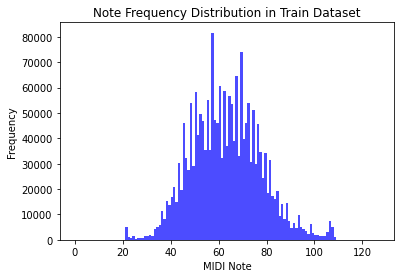

In [23]:
# Plot note frequency distribution
plt.hist(train_sequences, bins=range(0, 128), color='blue', alpha=0.7)
plt.title("Note Frequency Distribution in Train Dataset")
plt.xlabel("MIDI Note")
plt.ylabel("Frequency")
plt.show()

Model

In [24]:
class MusicLSTM(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        """
        LSTM Model for sequence-to-sequence music generation.
        """
        super(MusicLSTM, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        out, _ = self.lstm(x)
        out = self.fc(out[:, -1, :])  # Take the output of the last time step
        return out

# Initialize the model
input_size = 1  # Single feature for each note (normalized pitch)
hidden_size = 128  # Number of LSTM hidden units
output_size = 1  # Predicting one feature (next note's normalized pitch)

model = MusicLSTM(input_size, hidden_size, output_size)
print(model)

MusicLSTM(
  (lstm): LSTM(1, 128, batch_first=True)
  (fc): Linear(in_features=128, out_features=1, bias=True)
)


In [25]:
def load_model_weights(model, save_path="music_lstm.pth"):
    """
    Safely loads saved weights into the model.
    Args:
        model: The PyTorch model to load weights into.
        save_path: Path to the saved model weights.
    Returns:
        model: The model with loaded weights, if available.
    """
    if os.path.exists(save_path):
        try:
            # Use weights_only=True to address security concerns
            model.load_state_dict(torch.load(save_path, weights_only=True))
            print(f"Loaded model weights from {save_path}")
        except TypeError:
            # Fall back if weights_only is not supported by the PyTorch version
            model.load_state_dict(torch.load(save_path))
            print(f"Loaded model weights (fallback mode) from {save_path}")
    else:
        print(f"No saved weights found at {save_path}")
    return model

model = load_model_weights(model)

Loaded model weights from music_lstm.pth


In [27]:
# Convert normalized data to PyTorch tensors
train_inputs_tensor = torch.tensor(train_inputs).float().unsqueeze(-1)  # Add feature dimension
train_targets_tensor = torch.tensor(train_targets).float()

print(f"Train Inputs Tensor Shape: {train_inputs_tensor.shape}")
print(f"Train Targets Tensor Shape: {train_targets_tensor.shape}")

Train Inputs Tensor Shape: torch.Size([1998296, 70, 1])
Train Targets Tensor Shape: torch.Size([1998296])


In [28]:
import json
class EpochBatchTruncation:
    """
    Handles batch-level truncation logic for training.
    """
    def __init__(self, batch_patience=10, min_delta=0.001):
        self.batch_patience = batch_patience
        self.min_delta = min_delta
        self.no_improvement_count = 0
        self.prev_loss = float("inf")
        self.truncate_epoch = False

    def check_batch(self, current_loss):
        """
        Checks if the current batch's loss shows improvement.
        """
        if self.prev_loss - current_loss < self.min_delta:
            self.no_improvement_count += 1
            if self.no_improvement_count >= self.batch_patience:
                self.truncate_epoch = True
        else:
            self.no_improvement_count = 0
            self.truncate_epoch = False
        self.prev_loss = current_loss

In [29]:
def train_model_with_checkpointing_and_truncation(
    model, 
    train_inputs, 
    train_targets, 
    criterion, 
    optimizer, 
    epochs=100, 
    batch_size=64, 
    save_path="music_lstm.pth", 
    loss_path="loss_progression.json", 
    batch_patience=10, 
    min_delta=0.001
):
    """
    Trains the model with batch-level truncation and checkpointing.
    Tracks and saves loss progression for visualization.
    """
    train_inputs_tensor = torch.tensor(train_inputs).float().unsqueeze(-1)  # Add feature dimension
    train_targets_tensor = torch.tensor(train_targets).float()

    losses = []  # Track epoch loss progression

    for epoch in range(epochs):
        model.train()
        permutation = torch.randperm(train_inputs_tensor.size(0))  # Shuffle data
        epoch_loss = 0.0

        truncation = EpochBatchTruncation(batch_patience=batch_patience, min_delta=min_delta)

        with tqdm(total=len(train_inputs_tensor) // batch_size, desc=f"Epoch {epoch+1}/{epochs}") as pbar:
            for i in range(0, train_inputs_tensor.size(0), batch_size):
                indices = permutation[i:i + batch_size]
                batch_inputs = train_inputs_tensor[indices]
                batch_targets = train_targets_tensor[indices]

                # Zero gradients
                optimizer.zero_grad()

                # Forward pass
                outputs = model(batch_inputs)

                # Compute loss
                loss = criterion(outputs.squeeze(), batch_targets)

                # Backward pass and optimization
                loss.backward()
                optimizer.step()

                epoch_loss += loss.item()
                pbar.set_postfix({"Loss": loss.item()})
                pbar.update(1)

                # Check batch-level truncation
                truncation.check_batch(loss.item())
                if truncation.truncate_epoch:
                    print(f"Epoch {epoch+1} truncated after {i // batch_size + 1} batches.")
                    break

        # Track epoch loss
        avg_loss = epoch_loss / (len(train_inputs_tensor) // batch_size)
        losses.append(avg_loss)
        print(f"Epoch {epoch+1}/{epochs}, Loss: {avg_loss:.4f}")

        # Save model weights after every epoch
        torch.save(model.state_dict(), save_path)

        # Save loss progression to JSON
        with open(loss_path, "w") as f:
            json.dump(losses, f)

    print(f"Training complete. Model weights saved to {save_path}. Loss progression saved to {loss_path}.")
    return losses

In [30]:
# Training parameters
learning_rate = 0.001
epochs = 50
batch_size = 64
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

In [31]:
# Train the model with checkpointing and truncation
losses = train_model_with_checkpointing_and_truncation(
    model, 
    train_inputs, 
    train_targets, 
    criterion, 
    optimizer, 
    epochs, 
    batch_size, 
    save_path="music_lstm.pth", 
    loss_path="loss_progression.json", 
    batch_patience=10, 
    min_delta=0.001
)

Epoch 1/50:   4%|▍         | 1223/31223 [00:30<12:19, 40.58it/s, Loss=0.00553]


Epoch 1 truncated after 1223 batches.
Epoch 1/50, Loss: 0.0002


Epoch 2/50:  40%|███▉      | 12357/31223 [07:16<11:06, 28.29it/s, Loss=0.00737] 


Epoch 2 truncated after 12357 batches.
Epoch 2/50, Loss: 0.0021


Epoch 3/50:   3%|▎         | 868/31223 [00:32<18:48, 26.91it/s, Loss=0.00449]


Epoch 3 truncated after 868 batches.
Epoch 3/50, Loss: 0.0001


Epoch 4/50:   4%|▎         | 1139/31223 [00:30<13:17, 37.72it/s, Loss=0.00359]


Epoch 4 truncated after 1139 batches.
Epoch 4/50, Loss: 0.0002


Epoch 5/50:   7%|▋         | 2209/31223 [01:01<13:33, 35.66it/s, Loss=0.00594]


Epoch 5 truncated after 2209 batches.
Epoch 5/50, Loss: 0.0003


Epoch 6/50:   2%|▏         | 621/31223 [00:17<14:19, 35.62it/s, Loss=0.00631]


Epoch 6 truncated after 621 batches.
Epoch 6/50, Loss: 0.0001


Epoch 7/50:   2%|▏         | 662/31223 [00:18<14:13, 35.81it/s, Loss=0.00561]


Epoch 7 truncated after 662 batches.
Epoch 7/50, Loss: 0.0001


Epoch 8/50:   4%|▍         | 1182/31223 [00:32<13:54, 36.00it/s, Loss=0.00329]


Epoch 8 truncated after 1182 batches.
Epoch 8/50, Loss: 0.0002


Epoch 9/50:   1%|          | 247/31223 [00:06<13:24, 38.50it/s, Loss=0.00405]


Epoch 9 truncated after 247 batches.
Epoch 9/50, Loss: 0.0000


Epoch 10/50:  12%|█▏        | 3722/31223 [01:34<11:36, 39.47it/s, Loss=0.00542]


Epoch 10 truncated after 3722 batches.
Epoch 10/50, Loss: 0.0006


Epoch 11/50:  10%|█         | 3162/31223 [01:20<11:58, 39.05it/s, Loss=0.00574]


Epoch 11 truncated after 3162 batches.
Epoch 11/50, Loss: 0.0005


Epoch 12/50:   5%|▍         | 1429/31223 [00:47<16:39, 29.82it/s, Loss=0.00597]


Epoch 12 truncated after 1429 batches.
Epoch 12/50, Loss: 0.0002


Epoch 13/50:   3%|▎         | 889/31223 [00:26<14:54, 33.93it/s, Loss=0.00332]


Epoch 13 truncated after 889 batches.
Epoch 13/50, Loss: 0.0001


Epoch 14/50:   5%|▍         | 1542/31223 [00:38<12:24, 39.85it/s, Loss=0.004]  


Epoch 14 truncated after 1542 batches.
Epoch 14/50, Loss: 0.0002


Epoch 15/50:  15%|█▍        | 4583/31223 [01:56<11:18, 39.24it/s, Loss=0.00391]


Epoch 15 truncated after 4583 batches.
Epoch 15/50, Loss: 0.0007


Epoch 16/50:   1%|          | 378/31223 [00:09<13:18, 38.63it/s, Loss=0.00367]


Epoch 16 truncated after 378 batches.
Epoch 16/50, Loss: 0.0001


Epoch 17/50:   6%|▌         | 1734/31223 [00:49<14:08, 34.77it/s, Loss=0.00665] 


Epoch 17 truncated after 1734 batches.
Epoch 17/50, Loss: 0.0002


Epoch 18/50:  10%|█         | 3238/31223 [01:24<12:11, 38.24it/s, Loss=0.00551] 


Epoch 18 truncated after 3238 batches.
Epoch 18/50, Loss: 0.0005


Epoch 19/50:   1%|          | 190/31223 [00:04<12:21, 41.87it/s, Loss=0.00626]


Epoch 19 truncated after 190 batches.
Epoch 19/50, Loss: 0.0000


Epoch 20/50:   2%|▏         | 534/31223 [00:12<12:21, 41.38it/s, Loss=0.0034] 


Epoch 20 truncated after 534 batches.
Epoch 20/50, Loss: 0.0001


Epoch 21/50:   8%|▊         | 2645/31223 [01:15<13:35, 35.06it/s, Loss=0.00479]


Epoch 21 truncated after 2645 batches.
Epoch 21/50, Loss: 0.0004


Epoch 22/50:   6%|▌         | 1765/31223 [00:50<14:11, 34.61it/s, Loss=0.00325]  


Epoch 22 truncated after 1765 batches.
Epoch 22/50, Loss: 0.0002


Epoch 23/50:   0%|          | 47/31223 [00:01<15:02, 34.56it/s, Loss=0.00804]


Epoch 23 truncated after 47 batches.
Epoch 23/50, Loss: 0.0000


Epoch 24/50:   6%|▌         | 1746/31223 [00:53<15:01, 32.71it/s, Loss=0.00507]


Epoch 24 truncated after 1746 batches.
Epoch 24/50, Loss: 0.0002


Epoch 25/50:   8%|▊         | 2430/31223 [01:05<12:58, 37.00it/s, Loss=0.00576]


Epoch 25 truncated after 2430 batches.
Epoch 25/50, Loss: 0.0003


Epoch 26/50:   1%|          | 358/31223 [00:08<12:40, 40.60it/s, Loss=0.00561]


Epoch 26 truncated after 358 batches.
Epoch 26/50, Loss: 0.0000


Epoch 27/50:   6%|▋         | 1961/31223 [00:50<12:29, 39.03it/s, Loss=0.0104] 


Epoch 27 truncated after 1961 batches.
Epoch 27/50, Loss: 0.0003


Epoch 28/50:   6%|▋         | 2009/31223 [00:50<12:18, 39.56it/s, Loss=0.00361]


Epoch 28 truncated after 2009 batches.
Epoch 28/50, Loss: 0.0003


Epoch 29/50:   6%|▌         | 1806/31223 [00:45<12:19, 39.78it/s, Loss=0.00431]


Epoch 29 truncated after 1806 batches.
Epoch 29/50, Loss: 0.0003


Epoch 30/50:   1%|          | 374/31223 [00:09<13:44, 37.41it/s, Loss=0.00445]


Epoch 30 truncated after 374 batches.
Epoch 30/50, Loss: 0.0001


Epoch 31/50:   0%|          | 154/31223 [00:03<12:47, 40.48it/s, Loss=0.00402]


Epoch 31 truncated after 154 batches.
Epoch 31/50, Loss: 0.0000


Epoch 32/50:  10%|█         | 3261/31223 [01:36<13:49, 33.73it/s, Loss=0.00494]


Epoch 32 truncated after 3261 batches.
Epoch 32/50, Loss: 0.0005


Epoch 33/50:   0%|          | 40/31223 [00:01<13:13, 39.29it/s, Loss=0.00539]


Epoch 33 truncated after 40 batches.
Epoch 33/50, Loss: 0.0000


Epoch 34/50:   4%|▍         | 1209/31223 [00:30<12:47, 39.11it/s, Loss=0.00637]


Epoch 34 truncated after 1209 batches.
Epoch 34/50, Loss: 0.0002


Epoch 35/50:   1%|          | 183/31223 [00:04<12:58, 39.85it/s, Loss=0.00496]


Epoch 35 truncated after 183 batches.
Epoch 35/50, Loss: 0.0000


Epoch 36/50:   1%|          | 319/31223 [00:07<12:53, 39.94it/s, Loss=0.00449]


Epoch 36 truncated after 319 batches.
Epoch 36/50, Loss: 0.0000


Epoch 37/50:   2%|▏         | 483/31223 [00:12<13:10, 38.88it/s, Loss=0.00588]


Epoch 37 truncated after 483 batches.
Epoch 37/50, Loss: 0.0001


Epoch 38/50:   1%|          | 258/31223 [00:06<13:37, 37.89it/s, Loss=0.00693]


Epoch 38 truncated after 258 batches.
Epoch 38/50, Loss: 0.0000


Epoch 39/50:   2%|▏         | 729/31223 [00:19<13:17, 38.23it/s, Loss=0.00288]


Epoch 39 truncated after 729 batches.
Epoch 39/50, Loss: 0.0001


Epoch 40/50:   0%|          | 27/31223 [00:00<14:11, 36.64it/s, Loss=0.01]   


Epoch 40 truncated after 27 batches.
Epoch 40/50, Loss: 0.0000


Epoch 41/50:   3%|▎         | 953/31223 [00:24<12:50, 39.27it/s, Loss=0.0035] 


Epoch 41 truncated after 953 batches.
Epoch 41/50, Loss: 0.0001


Epoch 42/50:   4%|▍         | 1336/31223 [00:35<13:06, 38.00it/s, Loss=0.0061] 


Epoch 42 truncated after 1336 batches.
Epoch 42/50, Loss: 0.0002


Epoch 43/50:   6%|▌         | 1873/31223 [00:48<12:42, 38.50it/s, Loss=0.00193]


Epoch 43 truncated after 1873 batches.
Epoch 43/50, Loss: 0.0003


Epoch 44/50:   4%|▍         | 1209/31223 [00:33<13:46, 36.30it/s, Loss=0.00497]


Epoch 44 truncated after 1209 batches.
Epoch 44/50, Loss: 0.0002


Epoch 45/50:   5%|▍         | 1491/31223 [00:39<13:10, 37.63it/s, Loss=0.00442]


Epoch 45 truncated after 1491 batches.
Epoch 45/50, Loss: 0.0002


Epoch 46/50:   0%|          | 69/31223 [00:01<12:58, 39.99it/s, Loss=0.0047] 


Epoch 46 truncated after 69 batches.
Epoch 46/50, Loss: 0.0000


Epoch 47/50:   6%|▌         | 1756/31223 [00:45<12:41, 38.72it/s, Loss=0.00487]


Epoch 47 truncated after 1756 batches.
Epoch 47/50, Loss: 0.0002


Epoch 48/50:   1%|          | 283/31223 [00:07<13:01, 39.58it/s, Loss=0.00382]


Epoch 48 truncated after 283 batches.
Epoch 48/50, Loss: 0.0000


Epoch 49/50:  13%|█▎        | 4058/31223 [01:45<11:44, 38.58it/s, Loss=0.00295]


Epoch 49 truncated after 4058 batches.
Epoch 49/50, Loss: 0.0005


Epoch 50/50:  15%|█▌        | 4704/31223 [02:16<12:47, 34.56it/s, Loss=0.00446]  


Epoch 50 truncated after 4704 batches.
Epoch 50/50, Loss: 0.0006
Training complete. Model weights saved to music_lstm.pth. Loss progression saved to loss_progression.json.


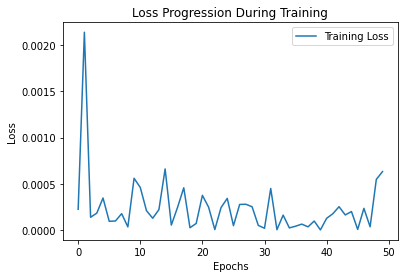

In [44]:
with open("loss_progression.json", "r") as f:
    losses = json.load(f)

# Plot the loss progression
plt.plot(losses, label="Training Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Loss Progression During Training")
plt.legend()
plt.show()

Model validation and evaluation

In [45]:
# Process validation data
valid_inputs, valid_targets = create_input_output_pairs(valid_sequences, sequence_length=50)
valid_inputs_normalized = valid_inputs / 127.0
valid_targets_normalized = valid_targets / 127.0

# Convert to PyTorch tensors
valid_inputs_tensor = torch.tensor(valid_inputs_normalized).float().unsqueeze(-1)
valid_targets_tensor = torch.tensor(valid_targets_normalized).float()

print(f"Validation Inputs Shape: {valid_inputs_tensor.shape}")
print(f"Validation Targets Shape: {valid_targets_tensor.shape}")

Validation Inputs Shape: torch.Size([170081, 50, 1])
Validation Targets Shape: torch.Size([170081])


In [46]:
def validate_model_in_batches(model, inputs_tensor, targets_tensor, criterion, batch_size=64):
    """
    Validates the model on the validation dataset in batches.
    Args:
        model: Trained model.
        inputs_tensor: Tensor of validation inputs.
        targets_tensor: Tensor of validation targets.
        criterion: Loss function.
        batch_size: Number of samples per batch.
    Returns:
        avg_loss: Average loss over the validation dataset.
    """
    model.eval()  # Set model to evaluation mode
    total_loss = 0.0
    num_batches = (len(inputs_tensor) + batch_size - 1) // batch_size  # Calculate the number of batches

    with torch.no_grad():
        for i in range(0, len(inputs_tensor), batch_size):
            batch_inputs = inputs_tensor[i:i + batch_size]
            batch_targets = targets_tensor[i:i + batch_size]

            # Forward pass
            outputs = model(batch_inputs)

            # Compute loss
            loss = criterion(outputs.squeeze(), batch_targets)
            total_loss += loss.item()

    avg_loss = total_loss / num_batches
    return avg_loss

# Validate model
val_loss = validate_model_in_batches(
    model,
    valid_inputs_tensor,
    valid_targets_tensor,
    criterion,
    batch_size=64  # Adjust batch size as needed
)

print(f"Validation Loss: {val_loss:.4f}")

Validation Loss: 0.0022


Music generation

In [75]:
def download_youtube_audio(youtube_url, output_path="seed_audio.wav"):
    """
    Downloads audio from YouTube and saves it as a WAV file, overwriting the file if it exists.
    """
    # Remove the file if it already exists
    if os.path.exists(output_path):
        os.remove(output_path)

    # Command to download the audio
    command = [
        "yt-dlp",
        "--extract-audio",
        "--audio-format", "wav",
        "--output", output_path,
        youtube_url,
    ]
    try:
        subprocess.run(command, check=True)
    except subprocess.CalledProcessError as e:
        print(f"Error downloading audio: {e}")
    return output_path

In [76]:
youtube_url = "https://www.youtube.com/watch?v=u5lSeYd_riw"  # Replace with actual URL
seed_audio_path = download_youtube_audio(youtube_url)

In [77]:
def play_audio_snippet(audio_path, start_time=0, duration=10):
    """
    Plays a snippet of an audio file.
    Args:
        audio_path: Path to the audio file (e.g., seed song WAV).
        start_time: Start time in seconds for the snippet.
        duration: Duration of the snippet in seconds.
    Returns:
        Audio object for playback in the notebook.
    """
    try:
        # Load the audio file
        y, sr = librosa.load(audio_path, sr=None)
        
        # Extract the snippet
        start_sample = int(start_time * sr)
        end_sample = int((start_time + duration) * sr)
        snippet = y[start_sample:end_sample]

        # Play the snippet
        return Audio(snippet, rate=sr)
    except Exception as e:
        print(f"Error playing audio snippet: {e}")
        return None

In [78]:
# Play a snippet of the seed song
play_audio_snippet(seed_audio_path, start_time=50, duration=10)

In [79]:
def extract_mfcc_features(wav_path, n_mfcc=13):
    """
    Extract MFCC features from a WAV file.
    Args:
        wav_path: Path to the WAV file.
        n_mfcc: Number of MFCC coefficients to extract.
    Returns:
        mfcc_features: Extracted MFCCs as a time-series matrix.
    """
    try:
        y, sr = librosa.load(wav_path, sr=None)  # Load audio
        mfcc_features = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc)
        return mfcc_features.T  # Transpose to match (time_steps x features)
    except Exception as e:
        print(f"Error extracting MFCCs from {wav_path}: {e}")
        return None

# Extract MFCCs from the seed audio
seed_features = extract_mfcc_features(seed_audio_path)

In [80]:
def preprocess_seed_features(seed_features):
    """
    Preprocess seed features to match the model's input requirements.
    Args:
        seed_features: Extracted MFCC features from the WAV file.
    Returns:
        processed_seed: Processed features compatible with the model.
    """
    # Use the first MFCC coefficient as the single feature (to align with model input)
    single_feature_seed = seed_features[:, 0]  # Use only the first MFCC coefficient

    # Normalize the seed features
    normalized_seed = single_feature_seed / np.max(np.abs(single_feature_seed))

    # Reshape to match model input requirements
    processed_seed = normalized_seed.reshape(-1, 1)
    return processed_seed

# Process the extracted seed features
processed_seed_features = preprocess_seed_features(seed_features)

In [81]:
def generate_music_from_seed(model, seed_features, num_steps=100):
    """
    Generates music using the provided seed features, with progress logging.
    
    Args:
        model: Trained LSTM model.
        seed_features: Initial features to start generation (processed and compatible with the model).
        num_steps: Number of steps to generate.
    
    Returns:
        generated_features: Generated features sequence (homogeneous in shape).
    """
    model.eval()
    generated_features = list(seed_features)  # Start with the seed
    input_seq = torch.tensor(seed_features).float().unsqueeze(0)  # Shape: (1, seq_len, input_size)

    with tqdm(total=num_steps, desc="Generating Music") as pbar:
        for step in range(num_steps):
            with torch.no_grad():
                # Model prediction
                output = model(input_seq)
                next_feature = output.squeeze().numpy()  # Convert to numpy array

                # Ensure next_feature is consistent with the input shape
                next_feature = next_feature.reshape(-1)  # Flatten if necessary to match (input_size,)

            # Append the new feature to the sequence
            generated_features.append(next_feature)

            # Update the input sequence
            next_feature_tensor = torch.from_numpy(next_feature).float().unsqueeze(0).unsqueeze(0)  # Shape: (1, 1, input_size)
            input_seq = torch.cat((input_seq[:, 1:, :], next_feature_tensor), dim=1)  # Concatenate along the sequence dimension

            # Update the progress bar
            pbar.set_postfix({"Step": step + 1})
            pbar.update(1)

    # Convert generated_features to a consistent NumPy array
    return np.array(generated_features, dtype=np.float32).reshape(len(generated_features), -1)

In [82]:
# Generate music using the LSTM model and processed seed features
generated_features = generate_music_from_seed(
    model,
    processed_seed_features,  # Seed features
    num_steps=100  # Number of steps to generate
)

Generating Music: 100%|██████████| 100/100 [00:42<00:00,  2.35it/s, Step=100]


In [83]:
def convert_to_audio(generated_features, sr=44100):
    """
    Convert generated features back to audio.
    Args:
        generated_features: Sequence of generated features (e.g., MFCCs).
        sr: Sampling rate for audio reconstruction.
    Returns:
        audio: Reconstructed audio signal.
    """
    # Convert MFCCs to Mel-spectrogram
    mel_spectrogram = librosa.feature.inverse.mfcc_to_mel(generated_features.T)

    # Convert Mel-spectrogram to audio using Griffin-Lim
    audio = librosa.griffinlim(mel_spectrogram)
    return audio

# Convert generated features to audio
generated_audio = convert_to_audio(generated_features)

# Play the audio in the notebook
from IPython.display import Audio
Audio(generated_audio, rate=44100)

In [84]:
# Play only up to 50 notes by default
play_sine_wave_sample(generated_features.squeeze(), max_notes=50)